# Ordinary Differential Equations and Chaotic Systems
## AEP 4380

### Problem Background
In this assignment, I implemented a generalized fourth-order Runga-Kutta method for a single time step for solving differential equations. I then use this method to solve a couple of classic chaotic systems and plot their trajectories along three-dimensional plots. 
In general, a set of differential equations needs to be broken down into a series of first-order equations. That way, the derivatives of each state in the system can be described as a function of the state itself, and iterated upon to propagate the solution in time.

In [2]:
import matplotlib.pyplot as plt
import numpy as np
from pylab import *
from mpl_toolkits.mplot3d import Axes3D
import plotly
import plotly.graph_objs as go
plt.style.use('dark_background') #Don't judge me
plt.rcParams['figure.figsize'] = [20, 10]
plotly.offline.init_notebook_mode()

## Solution Description
At a high level, I like to think of the Runge Kutta method as a fancy derivative. Instead of a "dead-reckoning" movement forward along a derivative linearly with

$$\frac{df}{dt}\times\Delta t = \Delta f$$

we take a few samples of the derivative at points further ahead in time (using previous slope measurements) and adjust our original prediction accordingly using a weighted average. For a system state $y$ and its derivative function $f(x,y)$, one can step from a starting state $(x_n, y_n)$ to $(x_{n+1}, y_{n+1})$ with the following set of equations:

$$k_1 = \frac{K_1}{h} = f(x_n, y_n)$$
$$k_2 = \frac{K_2}{h} = f(x_n+\frac{h}{2}, y_n+\frac{hk_1}{2})$$
$$k_3 = \frac{K_3}{h} = f(x_n+\frac{h}{2}, y_n+\frac{hk_2}{2})$$
$$k_4 = \frac{K_4}{h} = f(x_n+h, y_n+hk_3)$$
$$y_{n+1} = y_n+\frac{h}{6}(k_1+2(k_2+k_3)+k_4)$$

Where $x_{n+1} = x_n + h$.

<p align="center">
  <img src="img/a4/Runge-Kutta_slopes.png" width="400" alt="https://en.wikipedia.org/wiki/Runge%E2%80%93Kutta_methods#/media/File:Runge-Kutta_slopes.svg"/>
</p>
<a href="https://en.wikipedia.org/wiki/Runge%E2%80%93Kutta_methods#/media/File:Runge-Kutta_slopes.svg">Wikipedia image</a> visualizing the Runge-Kutta method.

So $k_1$ is a predicted slope at the starting point, and is used to get us halfway to the endpoint. The slope $k_2$ is then calculated at that midpoint. The slope $k_3$ represents the slope at the midpoint as if $k_2$ were used at the starting point instead of $k_1$. Finally, $k_4$ is calculated by using $k_3$ from the starting point across the whole interval.

At the suggestion of a coworker, I used a slightly more object-oriented technique in my implementation. By creating an object of a class which contains the proper derivative function, I can abstract the propagation of any object of said class with respect to its independent variable. This is also a convenient way to store the results of a particular set of initial conditions, allowing different objects to represent different starting conditions of a single set of ODEs. 

In [48]:
class ODE_Propagator:
    """An ordinary differential equation propagator using a 4th order Runga-Kutta method.

    Attributes:
        derivs (function): calculates the first order derivatives as a function of the state.
        state_history (list): list of states starting with the initial condition. The state format 
            should be (t, x, y, z...) where t is the independent variable, then (x, y, z...) the variables in order.
    """

    def __init__(self, initial_state, deriv_calculation):
        """A propagator needs an initial condition and a derivative calculator function defined for the same data format.
        
        The derivative function should expect data in the same format as the initial condition.
        This format should be (t, x, y, z...) where t is the independent variable, and the rest are the state variables.
        """
    
        self.derivs         = deriv_calculation #the derivative function to use for this ODE
        self.state_history  = [initial_state] #the state history, starting with the initial condition
    
    def reset(self):
        """Reset this propagator back to its initial condition."""
        self.state_history = [self.state_history[0]]
    
    def get_init_state(self):
        """Get the initial condition of this propagator.
        
        Returns: 
            The state at t=0
        """
        return self.state_history[0]

    def set_init_state(self, state, clear = True):
        """Set the initial condition of this propagator.
        
        Args:
            clear: Will reset the ode back to the initial condition assuming that changing the initial state is changed in order to re-simulate.
                    Default is True
        """
        self.state_history[0] = state
        if(clear):
            self.reset()

    def propagate(self, h, tmax = 0):
        """Moves the state of the system forward to tmax with h-sized steps. The state_history is filled with the results.
        
        Args:
            h: The constant step size to use for propagating the ODE.
            tmax: The time to stop propagating forward.
        """
        self.reset()
        state_init = self.state_history[0]
        points = int((tmax-self.state_history[0][0])/h)
        derivs_init = self.derivs(state_init)
        old_state = np.copy(state_init) #used to generate next state
        next_state = np.copy(state_init) #stores new calculated state
        old_derivs = np.copy(derivs_init) #used to generate next state
        for j in range(0,points-1):
            old_state = next_state
            old_derivs = self.derivs(next_state)
            next_state = self.rk4_step(old_state,h)
            self.state_history = np.append(self.state_history,[next_state],axis=0) 
    
    def rk4_step(self, state, h):
        """Propagates state one step of size h forward using the 4th order Runge-Kutta method.
        
        Args:
            h: The step size

        Returns:
            The new state after one time step forward.
        """
        state_derivs = self.derivs(state)
        n = len(state)
        state_half_k1 = np.copy(state)
        state_half_k2 = np.copy(state)
        state_k3 = np.copy(state)
        new_state = np.copy(state)
        indep_var_half = state[0] + 0.5*h #x_n + 0.5*h
        indep_var_full = state[0] + h #x_n + h
        state_half_k1[0] = indep_var_half
        for i in range(1,n):
            #y_n + 0.5*k_1 = y_n + 0.5*h*f(x_n, y_n)
            state_half_k1[i] = state[i] + (state_derivs[i]*0.5*h)
        #k_2 = h*f(x_n + 0.5*h, y_n + 0.5*k1)
        k_2 = self.derivs(state_half_k1)
        state_half_k2[0] = indep_var_half
        for i in range(1,n):
            #y_n + 0.5*k_2 = y_n + 0.5*h*f(x_n +0.5*h, y_n + 0.5*k2)
            state_half_k2[i] = state[i] + h*k_2[i]*0.5
        #k_3 = h*f(x_n + 0.5*h, y_n + 0.5*k2)
        k_3 = self.derivs(state_half_k2)
        state_k3[0] = indep_var_full
        for i in range(1,n):
            #y_n + k_3 = y_n + h*f(x_n + h, y_n + k_3)
            state_k3[i] = state[i] + h*k_3[i]
        k_4 = self.derivs(state_k3)
        for i in range(1,n):
            #y_(n+1) = y_n + k_1/6 + k_2/3 + k_3/3 + k4/6 + O(h^5)
            new_state[i] = state[i] + (h/6.0)*(state_derivs[i] + 2*(k_2[i] + k_3[i]) + k_4[i])
        new_state[0] = indep_var_full
        return new_state


To test that this is functioning properly, I first want to try it on the harmonic oscillator. The harmonic oscillator follows this equation (ignoring damping):

$$\frac{d^2y}{dt^2}+\omega^2y = 0$$

With $\omega$ as a constant angular frequency and initial conditions $y_0=1$ and $\frac{dy}{dt}|_{t=0} = 0$ this should give the solution 

$$y(t) = cos(\omega t)$$

To use my solver class, I need to re-write the harmonic oscillator as two first order equations:

$$\frac{dp}{dt} = v$$
$$\frac{dv}{dt} = -\omega^2p$$

Where $p$ represents the position of the pendulum and $v$ represents the velocity. I construct the appropriate derivative function below.

In [4]:
def derivs_harmonic(state, w = 1.0):
    # state is a numpy array in the format (t, p, v) where t is time, p is the position, and v is the velocity
    result = np.copy(state) #copy the incoming state, since the result will be the derivative of each element
    result[0] = state[0] #independent var. time in this case.
    result[1] = state[2] #derivative of the position (velocity)
    result[2] = -w*w*state[1] #derivative of the velocity (acceleration)
    return result

Now, propagating that equation and storing the solution can be contained within a call to <code>propagate()</code>:

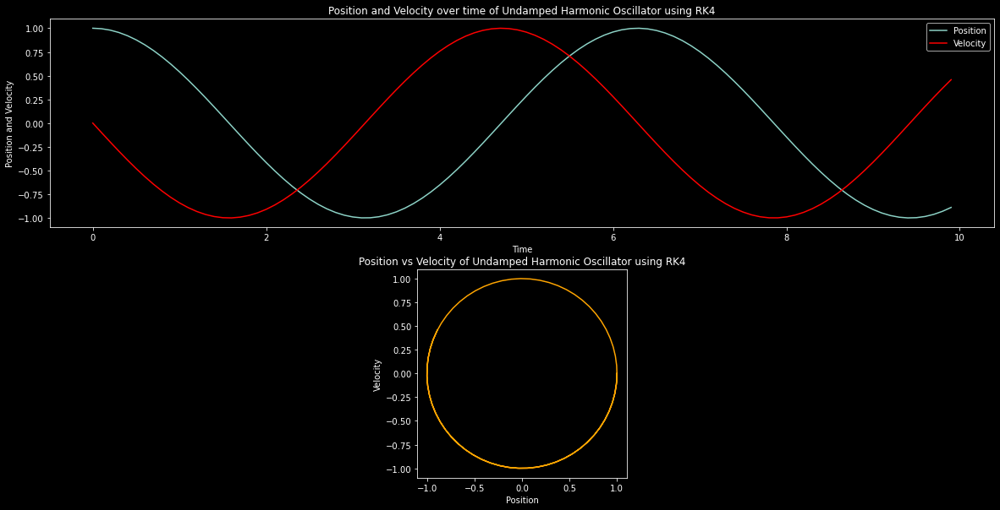

In [14]:
#create harmonic oscillator with starting condition y = 1 and dy/dt = 0
harmonic_osc = ODE_Propagator(np.array((0,1.0,0)), derivs_harmonic) 
#propagate to 10 units of the independent variable with step size 0.1
harmonic_osc.propagate(0.1,tmax = 10)

fig, axs = plt.subplots(2,1)
#Position and Velocity
axs[0].plot(harmonic_osc.state_history[:,0], harmonic_osc.state_history[:,1], label="Position")
axs[0].set_title("Position and Velocity over time of Undamped Harmonic Oscillator using RK4")
axs[0].set_xlabel("Time")
axs[0].set_ylabel("Position and Velocity")
axs[0].plot(harmonic_osc.state_history[:,0], harmonic_osc.state_history[:,2], label="Velocity", color = 'red')
axs[0].legend()

#Phase Space Plot
axs[1].plot(harmonic_osc.state_history[:,1], harmonic_osc.state_history[:,2], label="Phase Space", color = 'orange')
axs[1].set_title("Position vs Velocity of Undamped Harmonic Oscillator using RK4")
axs[1].set_xlabel("Position")
axs[1].set_ylabel("Velocity")
axs[1].set_aspect('equal')  # Set equal aspect ratio

This confirms that my functions are working correctly, since the $y=cos(\omega t)$ solution is found for $y(t)$ and $\frac{dy}{dt}$ is $\pi$ out of phase as expected for this system. Periodicity is $2\pi$ which is true for $\omega=1.0$. The phase space plot also shows a perfect circle for zero damping on this system. Damping can be added using a factor proportional to velocity in the calculation for acceleration:

In [6]:
def derivs_harmonic_damp(state, w = 1.0, b=0.2):
    # state is a numpy array in the format (t, p, v) where t is time, p is the position, and v is the velocity
    result = np.copy(state) #copy the incoming state, since the result will be the derivative of each element
    result[0] = state[0] #independent var. time in this case.
    result[1] = state[2] #derivative of the position (velocity)
    result[2] = -w*w*state[1] - b*state[2] #derivative of the velocity (acceleration) minus damping term proportional to velocity
    return result

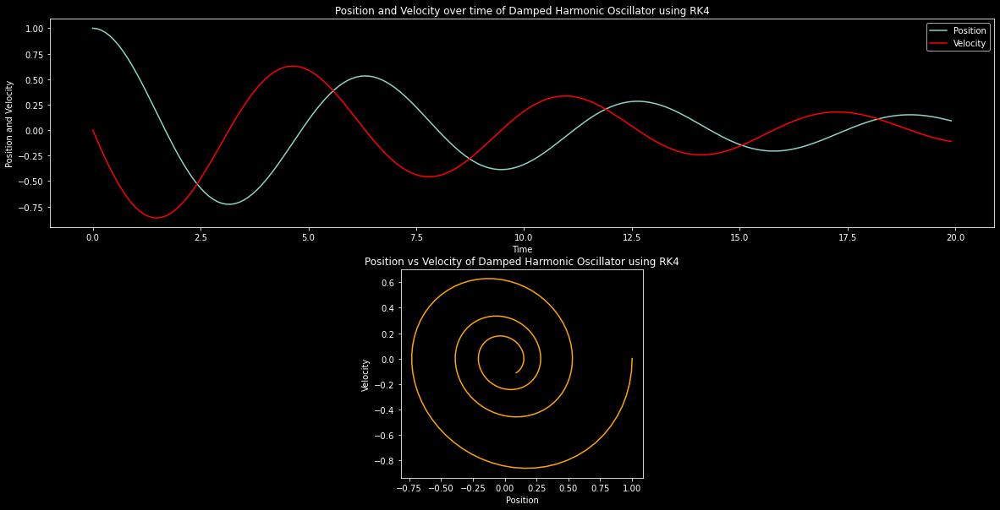

In [7]:
#create harmonic oscillator with starting condition y = 1 and dy/dt = 0
harmonic_osc_damp = ODE_Propagator(np.array((0,1.0,0)), derivs_harmonic_damp) 
#propagate to 10 units of the independent variable with step size 0.1
harmonic_osc_damp.propagate(0.1,tmax = 20)

fig, axs = plt.subplots(2,1)
#Position and Velocity
axs[0].plot(harmonic_osc_damp.state_history[:,0], harmonic_osc_damp.state_history[:,1], label="Position")
axs[0].set_title("Position and Velocity over time of Damped Harmonic Oscillator using RK4")
axs[0].set_xlabel("Time")
axs[0].set_ylabel("Position and Velocity")
axs[0].plot(harmonic_osc_damp.state_history[:,0], harmonic_osc_damp.state_history[:,2], label="Velocity", color = 'red')
axs[0].legend()

#Phase Space Plot
axs[1].plot(harmonic_osc_damp.state_history[:,1], harmonic_osc_damp.state_history[:,2], label="Phase Space", color = 'orange')
axs[1].set_title("Position vs Velocity of Damped Harmonic Oscillator using RK4")
axs[1].set_xlabel("Position")
axs[1].set_ylabel("Velocity")
axs[1].set_aspect('equal')  # Set equal aspect ratio

Next, I set up an ODE propagator using the Rossler system which is a version of the Lorenz system, both sets of ODEs with chaotic behavior. The Rossler system follows these first order equations:

$$\frac{dx}{dt} = -y-z$$
$$\frac{dy}{dt} = x+ay$$
$$\frac{dz}{dt} = b+z(x-c)$$

The values of $a$, $b$, and $c$ are set by the derivative function. By default I use $a=b=0.2$ and $c=5.7$.

In [46]:
def derivs_Rossler(state, a = 0.2, b = 0.2, c = 5.7):
    result = np.copy(state)
    dxdt = -1*(state[2] + state[3])
    dydt = state[1] + a*state[2]
    dzdt = b + state[3]*(state[1] - c)
    result[0] = state[0] #the independent variable
    result[1] = dxdt
    result[2] = dydt
    result[3] = dzdt
    return result

The $h$ value needs to be small enough to produce a stable output, so I first find a stable h value by comparing $x(t)$ plots using different step sizes.

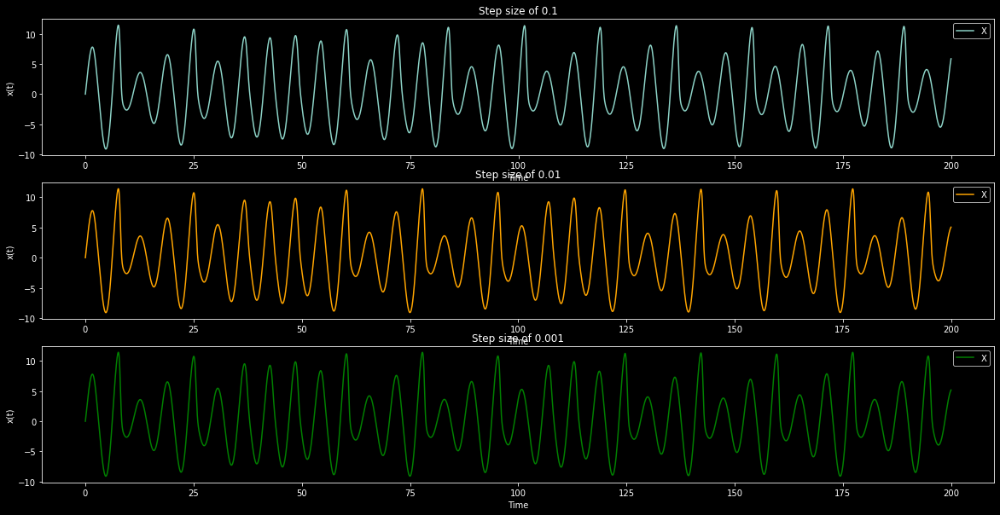

In [23]:
#create harmonic oscillator with starting condition y = 1 and dy/dt = 0
rossler = ODE_Propagator(np.array((0,0,-6.78,0.02)), derivs_Rossler) 
#propagate with step size 0.1
rossler.propagate(0.1,tmax = 200)

fig, axs = plt.subplots(3,1)
#x(t)
axs[0].plot(rossler.state_history[:,0], rossler.state_history[:,1], label="X")
axs[0].set_title("Step size of 0.1")
axs[0].set_xlabel("Time")
axs[0].set_ylabel("x(t)")
axs[0].legend()

rossler.reset() #clear history and redo with smaller step size
rossler.propagate(0.01,tmax = 200)

axs[1].plot(rossler.state_history[:,0], rossler.state_history[:,1], label="X", color = 'orange')
axs[1].set_title("Step size of 0.01")
axs[1].set_xlabel("Time")
axs[1].set_ylabel("x(t)")
axs[1].legend()

rossler.reset() #clear history and redo with smaller step size
rossler.propagate(0.005,tmax = 200)

axs[2].plot(rossler.state_history[:,0], rossler.state_history[:,1], label="X", color = 'green')
axs[2].set_title("Step size of 0.001")
axs[2].set_xlabel("Time")
axs[2].set_ylabel("x(t)")
axs[2].legend()

While there is a clear difference between $h=0.1$ and $h=.01$, that difference is hard to see going to down to $h=0.05$, so I'll stick to $h=0.01$ for now. Plotting each dimension along with some phase space plots of the variables against one another, the chaotic behavior becomes more obvious.

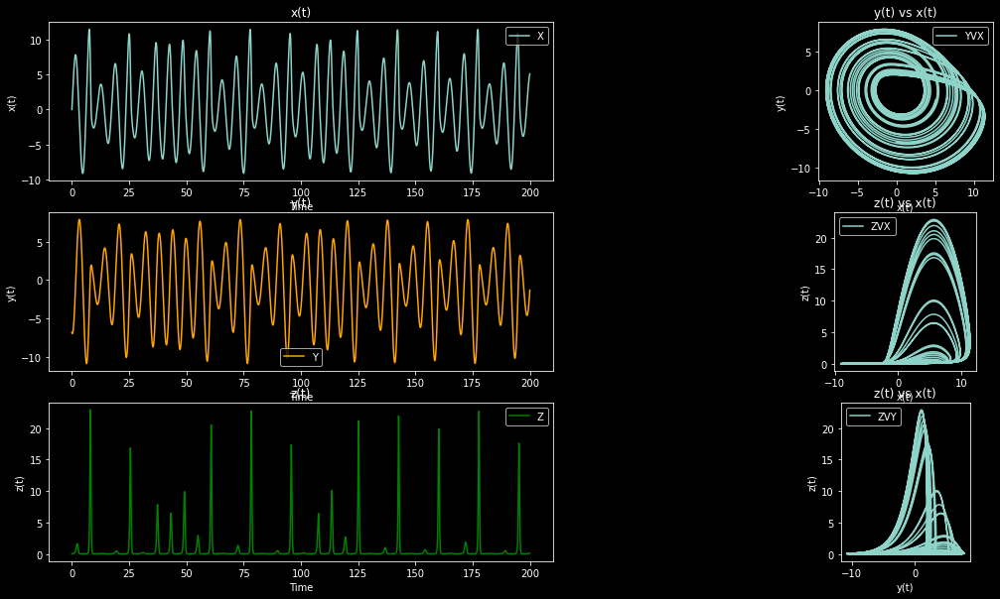

In [34]:
rossler.reset() #clear history and redo with smaller step size
rossler.propagate(0.01,tmax = 200)

fig, axs = plt.subplots(3,2)
#x(t)
axs[0,0].plot(rossler.state_history[:,0], rossler.state_history[:,1], label="X")
axs[0,0].set_title("x(t)")
axs[0,0].set_xlabel("Time")
axs[0,0].set_ylabel("x(t)")
axs[0,0].legend()
#y(t)
axs[1,0].plot(rossler.state_history[:,0], rossler.state_history[:,2], label="Y", color = 'orange')
axs[1,0].set_title("y(t)")
axs[1,0].set_xlabel("Time")
axs[1,0].set_ylabel("y(t)")
axs[1,0].legend()
#z(t)
axs[2,0].plot(rossler.state_history[:,0], rossler.state_history[:,3], label="Z", color = 'green')
axs[2,0].set_title("z(t)")
axs[2,0].set_xlabel("Time")
axs[2,0].set_ylabel("z(t)")
axs[2,0].legend()

#y(t) vs x(t)
axs[0,1].plot(rossler.state_history[:,1], rossler.state_history[:,2], label="YVX")
axs[0,1].set_title("y(t) vs x(t)")
axs[0,1].set_xlabel("x(t)")
axs[0,1].set_ylabel("y(t)")
axs[0,1].set_aspect('equal')
axs[0,1].legend()
#z(t) vs x(t)
axs[1,1].plot(rossler.state_history[:,1], rossler.state_history[:,3], label="ZVX")
axs[1,1].set_title("z(t) vs x(t)")
axs[1,1].set_xlabel("x(t)")
axs[1,1].set_ylabel("z(t)")
axs[1,1].set_aspect('equal')
axs[1,1].legend()
#z(t) vs y(t)
axs[2,1].plot(rossler.state_history[:,2], rossler.state_history[:,3], label="ZVY")
axs[2,1].set_title("z(t) vs x(t)")
axs[2,1].set_xlabel("y(t)")
axs[2,1].set_ylabel("z(t)")
axs[2,1].set_aspect('equal')
axs[2,1].legend()

So the plots don't look very periodic, and they inidicate some "attractor" behavior which is recognizable for some chaotic systems. This is better viewed in three dimensions:

In [32]:
# 3d plot of chaotic system data for rossler and lorenz systems
# copied from https://stackoverflow.com/questions/38364435/python-matplotlib-make-3d-plot-interactive-in-jupyter-notebook
# and https://plotly.com/python/3d-line-plots/
def plot_3d_custom(data_3d):
    trace = go.Scatter3d(
        x=data_3d[:,1],  # <-- Put your data instead
        y=data_3d[:,2],  # <-- Put your data instead
        z=data_3d[:,3],  # <-- Put your data instead
        mode='lines',
        line=dict(
        color='darkblue',
        width=2
        )
    )

    layout = go.Layout(
        margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
    )

    data = [trace]

    plot_figure = go.Figure(data=data, layout=layout)

    # Render the plot.
    plotly.offline.iplot(plot_figure)

plot_3d_custom(rossler.state_history)

Because chaotic systems are sensitive to initial conditions, we can try showing how quickly a solution diverges with another slightly different run of the same system. With only a $0.01$ change in the initial condition, they diverge by around $t=100$.

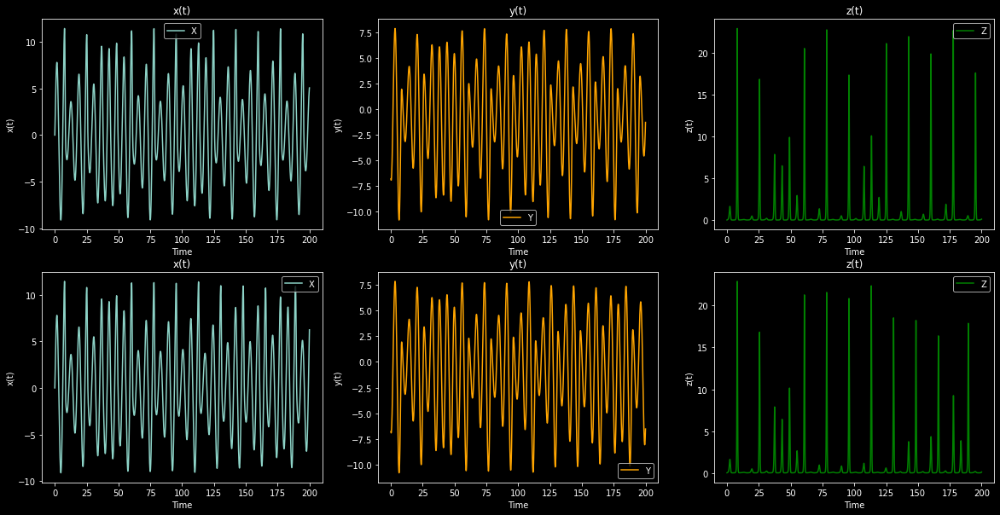

In [38]:
rossler_2 = ODE_Propagator(np.array((0,0,-6.78+.01,0.02)), derivs_Rossler) 
rossler_2.propagate(0.01, tmax=200)

fig, axs = plt.subplots(2,3)
#x(t) 1
axs[0,0].plot(rossler.state_history[:,0], rossler.state_history[:,1], label="X")
axs[0,0].set_title("x(t)")
axs[0,0].set_xlabel("Time")
axs[0,0].set_ylabel("x(t)")
axs[0,0].legend()
#x(t) 2
axs[1,0].plot(rossler_2.state_history[:,0], rossler_2.state_history[:,1], label="X")
axs[1,0].set_title("x(t)")
axs[1,0].set_xlabel("Time")
axs[1,0].set_ylabel("x(t)")
axs[1,0].legend()
#y(t) 1
axs[0,1].plot(rossler.state_history[:,0], rossler.state_history[:,2], label="Y", color = 'orange')
axs[0,1].set_title("y(t)")
axs[0,1].set_xlabel("Time")
axs[0,1].set_ylabel("y(t)")
axs[0,1].legend()
#y(t) 2
axs[1,1].plot(rossler_2.state_history[:,0], rossler_2.state_history[:,2], label="Y", color = 'orange')
axs[1,1].set_title("y(t)")
axs[1,1].set_xlabel("Time")
axs[1,1].set_ylabel("y(t)")
axs[1,1].legend()
#z(t) 1
axs[0,2].plot(rossler.state_history[:,0], rossler.state_history[:,3], label="Z", color = 'green')
axs[0,2].set_title("z(t)")
axs[0,2].set_xlabel("Time")
axs[0,2].set_ylabel("z(t)")
axs[0,2].legend()
#z(t) 2
axs[1,2].plot(rossler_2.state_history[:,0], rossler_2.state_history[:,3], label="Z", color = 'green')
axs[1,2].set_title("z(t)")
axs[1,2].set_xlabel("Time")
axs[1,2].set_ylabel("z(t)")
axs[1,2].legend()

Setting $a=0.1$ can send this system to a more predictable non-chaotic path:

In [47]:
def derivs_Rossler_nonchaotic(state, a = 0.1, b = 0.2, c = 5.7):
    result = np.copy(state)
    dxdt = -1*(state[2] + state[3])
    dydt = state[1] + a*state[2]
    dzdt = b + state[3]*(state[1] - c)
    result[0] = state[0] #the independent variable
    result[1] = dxdt
    result[2] = dydt
    result[3] = dzdt
    return result

rossler_3 = ODE_Propagator(np.array((0,0,-6.78,0.02)), derivs_Rossler_nonchaotic) 
rossler_3.propagate(0.01, tmax=200)
plot_3d_custom(rossler_3.state_history)

And while we're here, I might as well simulate and plot the full Lorenz system to see the classic "butterfly effect" graph.

In [39]:
def derivs_Lorenz(state, sig = 10.0, rho = 28.0, bet = 8*.333333):
    result = np.copy(state)
    result[1] = sig*(state[2] - state[1])
    result[2] = state[1]*(rho-state[3]) - state[2]
    result[3] = state[1]*state[2] - bet*state[3]
    result[0] = state[0] #the independent variable
    return result

In [45]:
lorenz = ODE_Propagator((0.0, 1.0, 1.0, 1.0),derivs_Lorenz)
lorenz.propagate(.01, tmax=100)
plot_3d_custom(lorenz.state_history)

Beautiful! With that I'm pretty satisfied with the current state of my <code>ODE_Propagator</code>, but there is more functionality that we will add in the next assignment, including an adaptive step size method.